# Text analysis of Intro to Data Science courses

## Packages

In [1]:
import pandas as pd
import numpy as np
from os import walk
import sklearn 

import regex # for tokenizing
import nltk # for stop words
nltk.download('stopwords')

from collections import Counter # for word counts

# visualization tools
from wordcloud import WordCloud
from matplotlib import pyplot as plt

from textacy import extract #Key Word in Context - pulls surrounding text for a keyword

import random

import re # for regex cleaning
import html
import textacy.preprocessing as tprep # normalizing

# topic modeling
from sklearn.feature_extraction.text import TfidfVectorizer
from spacy.lang.en.stop_words import STOP_WORDS as stopwords
from sklearn.decomposition import NMF
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from tqdm import tqdm

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\wat6sv\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Read in Data

In [2]:
mypath = "c:\\Users\\wat6sv\\OneDrive - University of Virginia\\23_DataScientist\\DS Syllabi\\txt_files" #path to dir that holds txt files
files = next(walk(mypath), (None, None, []))[2] #file names (with .txt)

In [3]:
# remove .txt from file names to get syllabus names

syll_names = [file[:-4] for file in files]
syll_names = [file for file in syll_names if file is not None]

In [4]:
corpus = pd.DataFrame()

# Read in text from each file - save to corpus df along with syllabus name
for file in files:
    path = mypath+"\\"+file
    with open(path, encoding='latin-1') as f:
        # print(chardet.detect(f.read())['encoding'])
        line = f.read()#.decode(chardet.detect(f.read())['encoding'])
        temp = pd.DataFrame({"name":syll_names[files.index(file)], "text":line}, index=[0])
        corpus = pd.concat([corpus, temp])
        f.close()


corpus = corpus.reset_index(drop=True)



In [5]:
# add length field to df
corpus['length'] = corpus['text'].str.len()

## Visualize data distributions

<Axes: title={'center': 'Length of Syllabi'}>

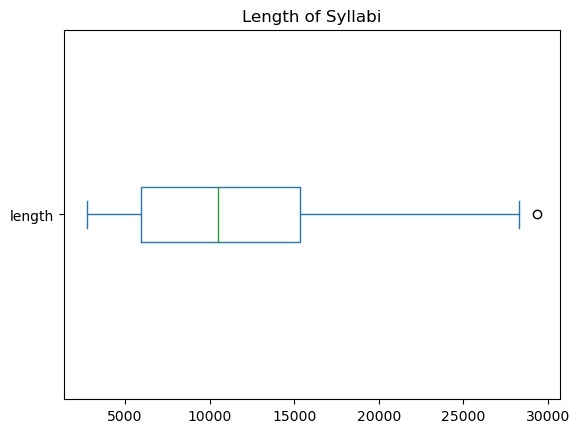

In [6]:
corpus['length'].plot(kind='box', vert=False, title="Length of Syllabi")

<Axes: title={'center': 'Distribution of Length'}, ylabel='Frequency'>

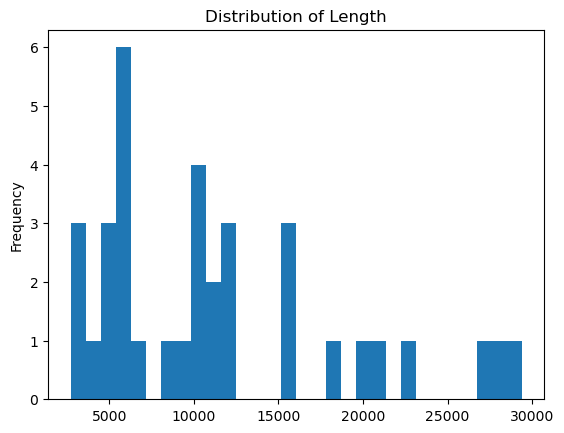

In [7]:
corpus['length'].plot(kind='hist', bins=30, title="Distribution of Length")

## Tokenize

In [8]:
def tokenize(text):
    return regex.findall(r'[\w]*\p{L}[\w]*', text)

In [9]:
stopwords = set(nltk.corpus.stopwords.words('english')) #convert to set for fast lookup
# stopwords |= {'n', 'b', "www", "http", "https", "xe2", "xa2", "x80", "00pm", "pm"} # add stop words
# stopwords -= {} #remove stopwords

def remove_stop(tokens):
    return [t for t in tokens if t.lower() not in stopwords]

In [10]:
pipeline = [str.lower, tokenize, remove_stop]

def prepare(text, pipeline):
    tokens = str(text)
    for transform in pipeline:
        tokens = transform(tokens)
    return tokens 

In [11]:
corpus['tokens'] = corpus['text'].apply(prepare, pipeline=pipeline)

In [12]:
corpus['num_tokens'] = corpus['tokens'].map(len)

In [13]:
def count_words(df, column='tokens', preprocess=None, min_freq=2):

    # process tokens and update counter
    def update(doc):
        tokens = doc if preprocess is None else preprocess(doc)
        counter.update(tokens)

    # create counter and run through all data
    counter = Counter()

    if type(df) == pd.DataFrame:
        df[column].map(update)
    else:
        counter.update(df[column])

    # transform counter into a DataFrame
    freq_df = pd.DataFrame.from_dict(counter, orient='index', columns=['freq'])
    freq_df = freq_df.query('freq >= @min_freq')
    freq_df.index.name = 'token'

    return freq_df.sort_values('freq', ascending=False)

In [14]:
freq_df = count_words(corpus)

### Visualize Tokens

[Text(0.5, 0, 'Frequency'), Text(0, 0.5, 'Token'), Text(0.5, 1.0, 'Top Words')]

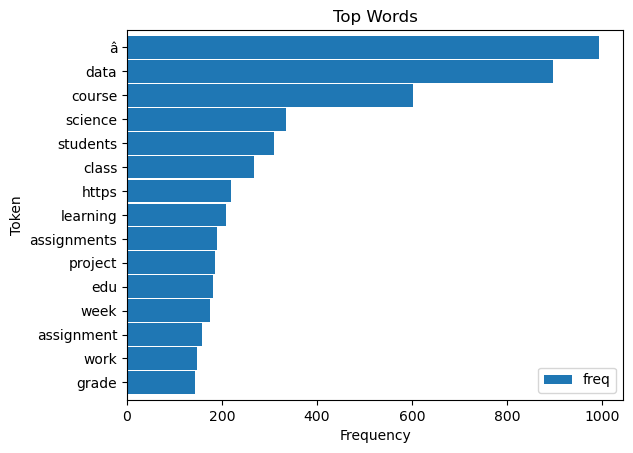

In [15]:
ax = freq_df.head(15).plot(kind='barh', width=0.95)
ax.invert_yaxis()
ax.set(xlabel='Frequency', ylabel='Token', title='Top Words')

In [16]:
def wordcloud(word_freq, save_plot = False, save_name = None, title=None, max_words=200, stopwords=None):

    wc = WordCloud(background_color="white", max_words=max_words,
                       width=960, height=540)

    # convert DataFrame into dict
    if type(word_freq) == pd.Series:
        counter = Counter(word_freq.fillna(0).to_dict())
    else:
        counter = word_freq

    # filter stop words in frequency counter
    if stopwords is not None:
        counter = {token:freq for (token, freq) in counter.items()
                              if token not in stopwords}
    wc.generate_from_frequencies(counter)
    plt.figure(figsize=(12,12))

    plt.title(title)

    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")

    if save_plot:
        plt.savefig(f'{save_name}.png')

        # 
        # plt.imshow(wc, interpolation='bilinear')
        # plt.axis("off")
        # # if you don't want to save the topic model, comment the next line
        # plt.savefig(f'{model_name}_topic{topic}.png')

### Word Clouds

#### All syllabi in Corpus

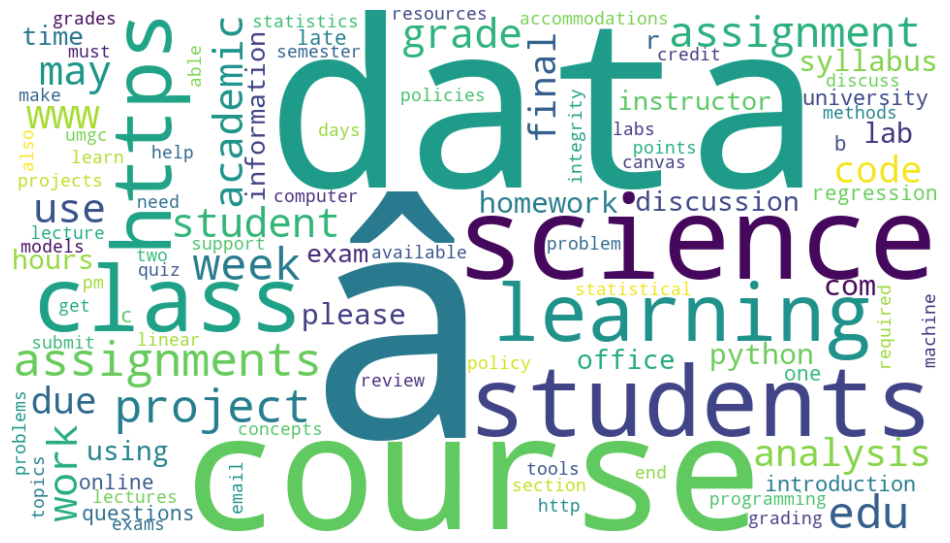

In [17]:
wordcloud(freq_df['freq'], max_words = 100)

#### Individual Schools

ASU
Boston_Uni
Brown
Cornell
CUNY
Drexel
Georgia_Tech
Harvard
LSU
MIT
Montgomery_Coll
NYU_DS4E
NYU_IntroDS
Princeton
Rutgers
UCBerkeley
UCSanDiego
UIU_107
UIU_207
UKentucky
UMaine


C:\Users\wat6sv\AppData\Local\Temp\ipykernel_20236\621386210.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12,12))


UMD
UniSys_Georgia
USouthampton
UToronto
UUtah
UVA_SDS
UVA_Stat
UWashington
UWisconsin
UWisc_Madison_Modeling
UWisc_Madison_Programming
UZurich
Washington_State
William_and_Mary


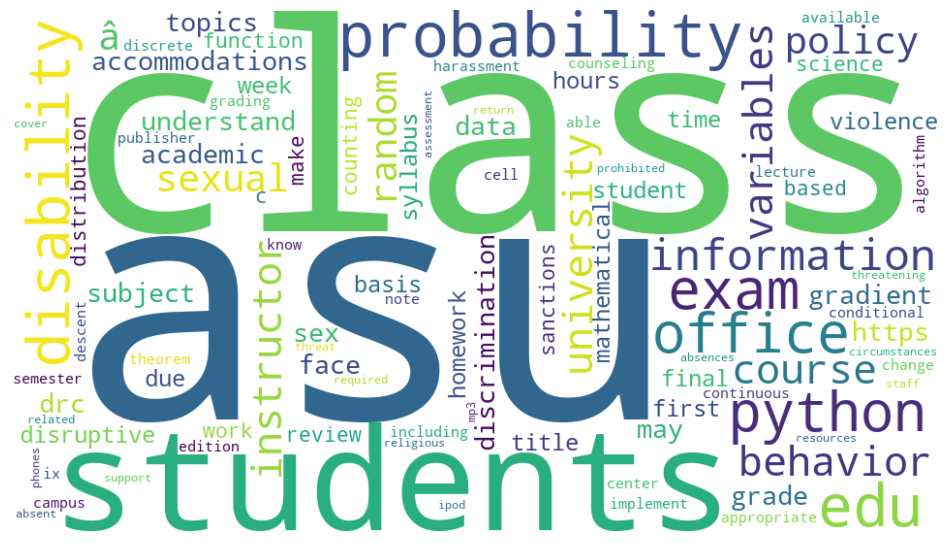

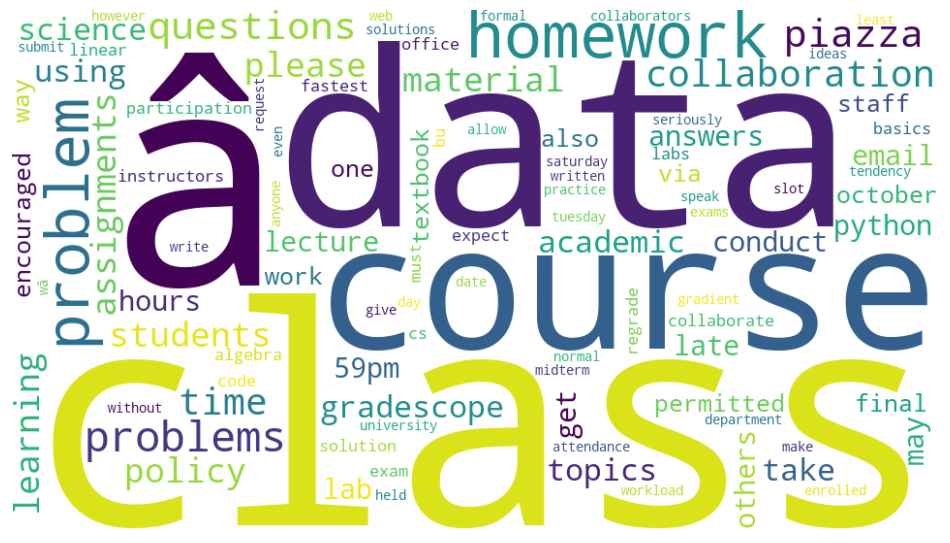

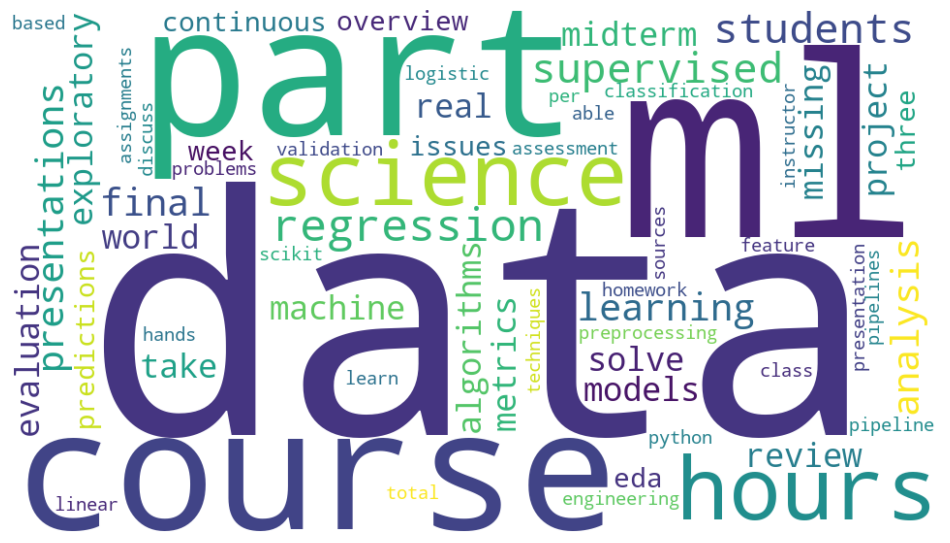

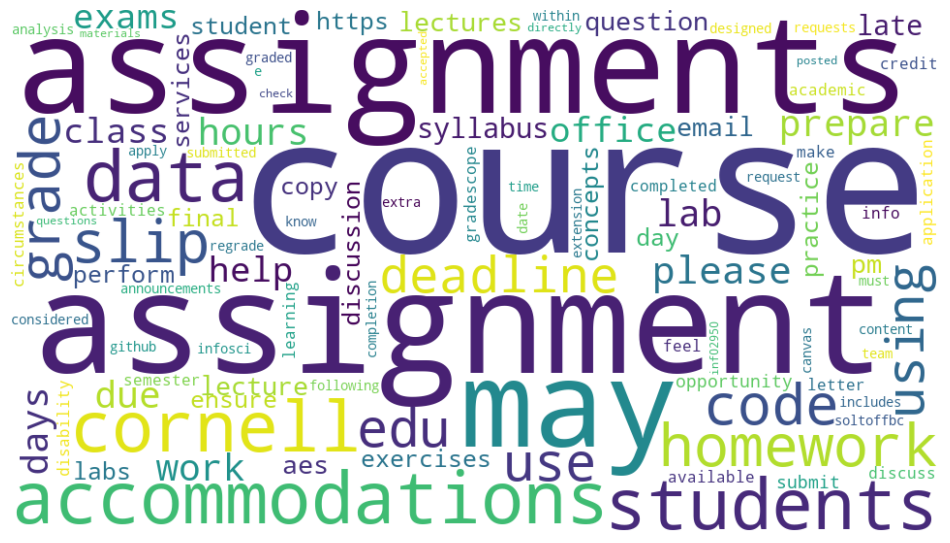

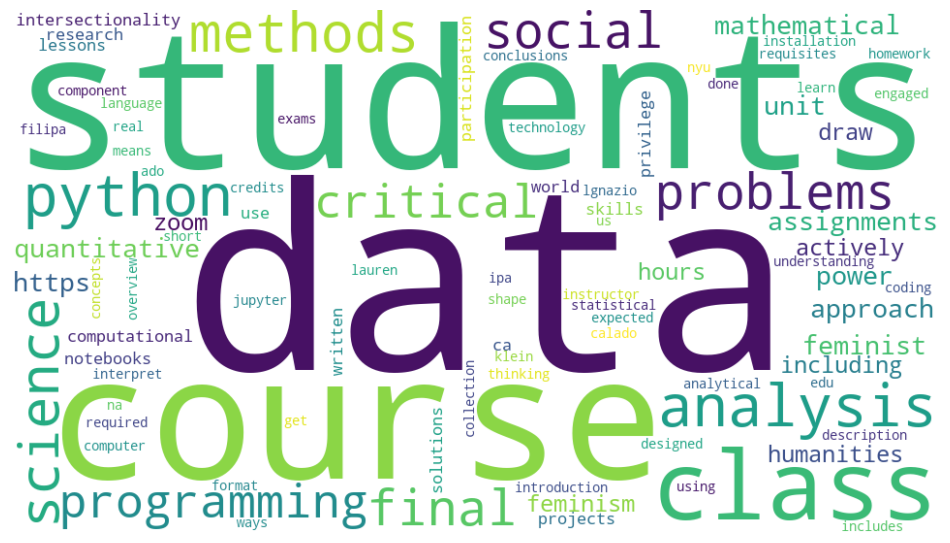

...

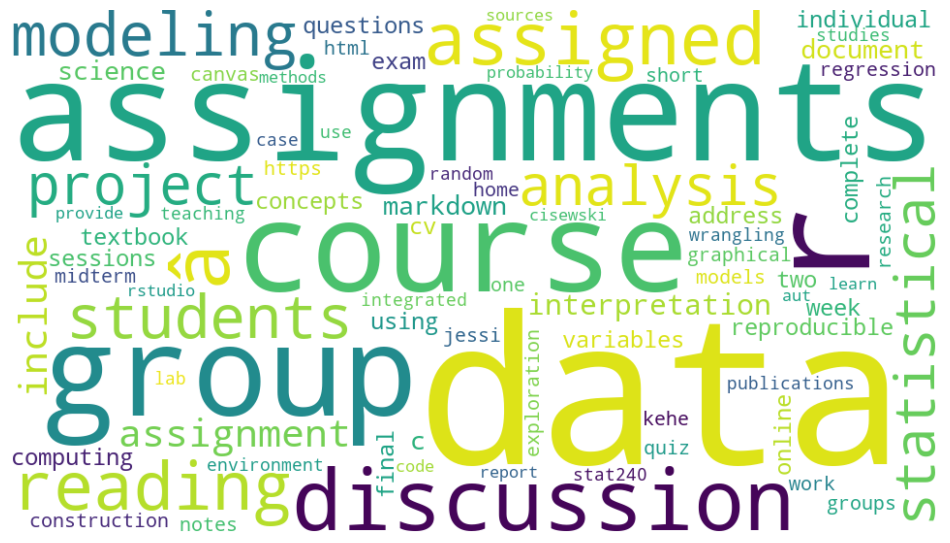

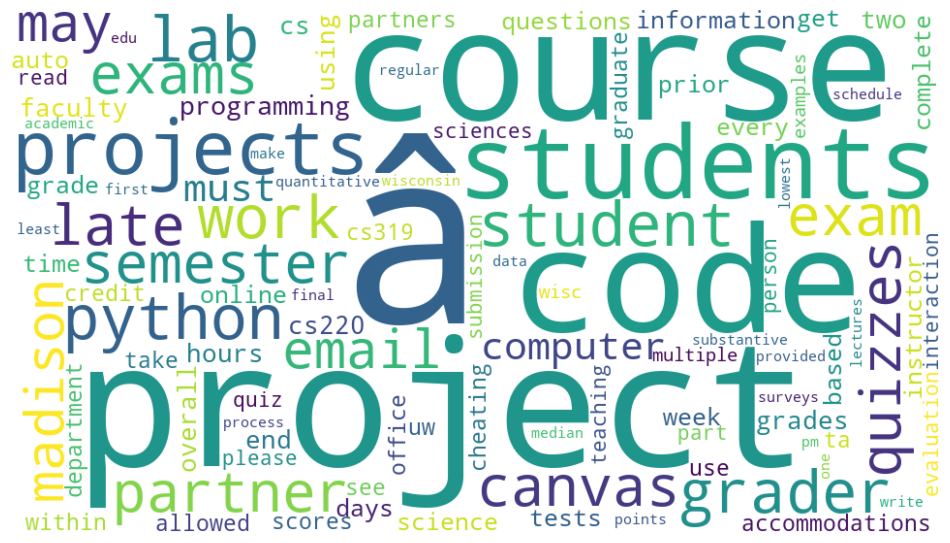

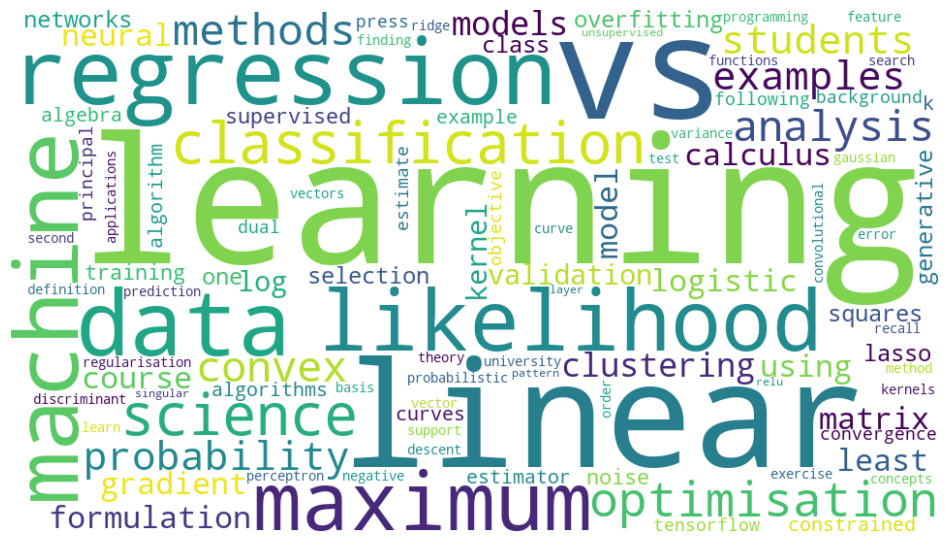

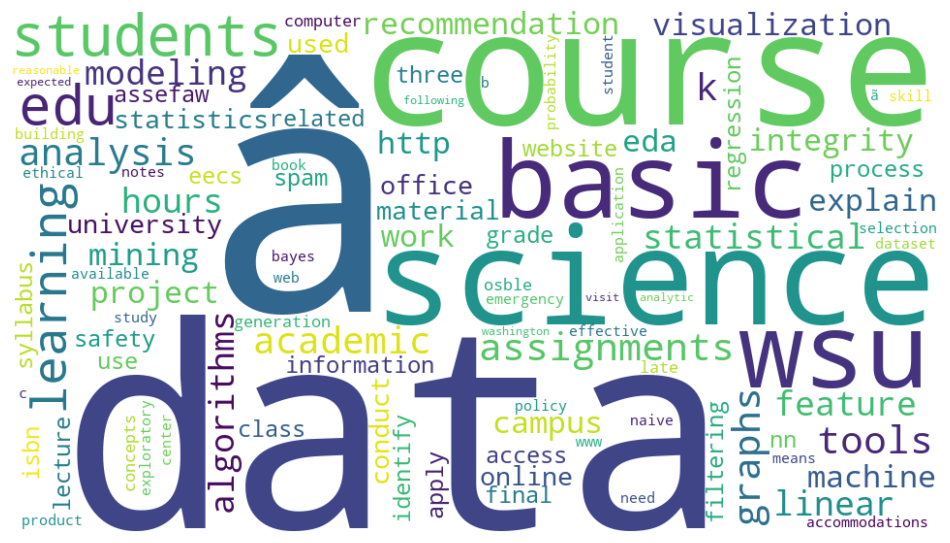

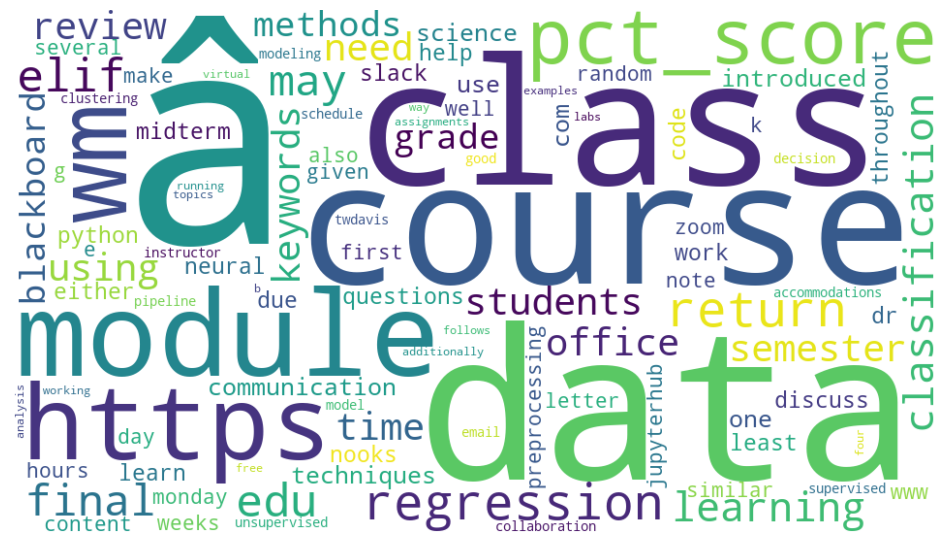

In [18]:
for index, rows in corpus.iterrows():
    print(corpus.iloc[index,0])
    wordcloud(count_words(corpus.iloc[index,:])['freq'], max_words = 100)

## TF-IDF

In [19]:
def compute_idf(df, column='tokens', preprocess=None, min_df=2):

    def update(doc):
        tokens = doc if preprocess is None else preprocess(doc)
        counter.update(set(tokens))

    # count tokens
    counter = Counter()
    df[column].map(update)

    # create DataFrame and compute idf
    idf_df = pd.DataFrame.from_dict(counter, orient='index', columns=['df'])
    idf_df = idf_df.query('df >= @min_df')
    idf_df['idf'] = np.log(len(df)/idf_df['df'])+0.1
    idf_df.index.name = 'token'
    return idf_df

In [20]:
idf_df = compute_idf(corpus)

C:\Users\wat6sv\AppData\Local\Temp\ipykernel_20236\4234653083.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  idf_df['idf'] = np.log(len(df)/idf_df['df'])+0.1


In [21]:
freq_df['tfidf'] = freq_df['freq'] * idf_df['idf']

In [22]:
freq_df

,freq,tfidf
token,,
â,994,286.323918
data,896,89.600000
course,602,60.200000
science,334,33.400000
students,309,30.900000
...,...,...
formulate,2,5.924402
jim,2,NaN
contacts,2,5.924402


## KWIC (Key word in Context)

In [23]:
def kwic(doc_series, keyword, window=35, print_samples=5):

    def add_kwic(text):
        kwic_list.extend(extract.kwic.keyword_in_context(text, keyword, ignore_case=True,
                              window_width=window))#, print_only=False))

    kwic_list = []
    doc_series.map(add_kwic)

    if print_samples is None or print_samples==0:
        return kwic_list
    else:
        k = min(print_samples, len(kwic_list))
        print(f"{k} random samples out of {len(kwic_list)} " + \
              f"contexts for '{keyword}':")
        for sample in random.sample(list(kwic_list), k):
            print(re.sub(r'[\n\t]', ' ', sample[0])+'  '+ \
                  sample[1]+'  '+\
                  re.sub(r'[\n\t]', ' ', sample[2]))

In [24]:
kwic(doc_series = corpus['text'], keyword = 'Python' )

5 random samples out of 129 contexts for 'Python':
13)   Learning the Pandas Library:   Python   Tools for Data Munging, Analysis, 
â¢ Automate the Boring Stuff with   Python   by Al Sweigart: Read Online   â¢ 
 to Data Science programming using   Python  . No previous programming experienc
only used data science package for   python  , work with functions and randomnes
n to Python (Ch. 3: Programming in   Python  )   â¢ 3.2: Data types and sequenc


## n-grams

In [25]:
def ngrams(tokens, n=2, sep=' ', stopwords=set()):
    return [sep.join(ngram) for ngram in zip(*[tokens[i:] for i in range(n)])
            if len([t for t in ngram if t in stopwords])==0]



In [26]:
corpus['bigrams'] = corpus['text'].apply(prepare, pipeline=[str.lower, tokenize]) \
                          .apply(ngrams, n=2, stopwords=stopwords)

corpus['trigrams'] = corpus['text'].apply(prepare, pipeline=[str.lower, tokenize]) \
                          .apply(ngrams, n=3, stopwords=stopwords)

count_words(corpus, 'bigrams').head(20)

,freq
token,
data science,290
https www,83
machine learning,70
office hours,61
data analysis,57
academic integrity,53
http www,44
final exam,40
big data,39


C:\Users\wat6sv\AppData\Local\Temp\ipykernel_20236\4234653083.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  idf_df['idf'] = np.log(len(df)/idf_df['df'])+0.1


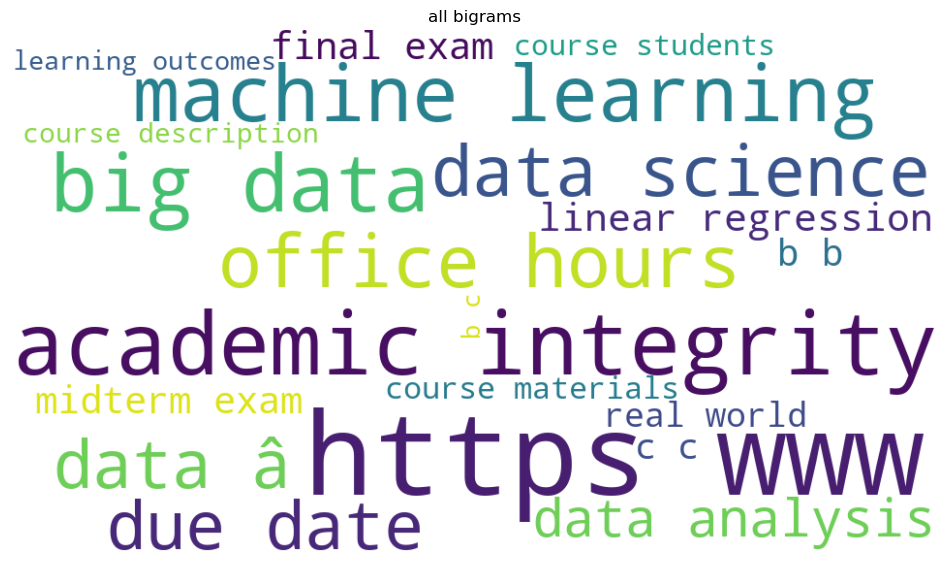

In [27]:
# concatenate existing IDF DataFrame with bigram IDFs
idf_df = pd.concat([idf_df, compute_idf(corpus, 'bigrams', min_df=10)])

freq_df = count_words(corpus, 'bigrams')
freq_df['tfidf'] = freq_df['freq'] * idf_df['idf']
wordcloud(freq_df['tfidf'], title='all bigrams', max_words=50)

## Prep for Stats/ML Pipeline

### Identify & remove noise

In [28]:
RE_SUSPICIOUS = re.compile(r'[&#<>{}\[\]\\]')

def impurity(text, min_len=10):
    """returns the share of suspicious characters in a text"""
    if text == None or len(text) < min_len:
        return 0
    else:
        return len(RE_SUSPICIOUS.findall(text))/len(text)*100

print(impurity(corpus.loc[0,'text']), '%')

0.0278344776396363 %


In [29]:
corpus['impurity'] = corpus['text'].apply(impurity, min_len=10)

corpus[['text', 'impurity']].sort_values(by='impurity', ascending=False).head(3)

,text,impurity
26,# DS 1001: Foundations of Data Science \n\nYou...,0.503901
23,"8/17/23, 4:51 PM \n\nFoundations of Data Scien...",0.433189
27,STAT 1602: Introduction to Data Science with P...,0.228460


In [30]:
count_words(corpus, column='text', preprocess=lambda t: re.findall(r'#|:|\\', t))

,freq
token,
:,1726
#,79
\,2


In [31]:
def clean(text):
    # convert html escapes like &amp; to characters.
    text = html.unescape(text)
    # tags like <tab>
    text = re.sub(r'<[^<>]*>', ' ', text)
    # markdown URLs like [Some text](https://....)
    text = re.sub(r'\[([^\[\]]*)\]\([^\(\)]*\)', r'\1', text)
    # text or code in brackets like [0]
    text = re.sub(r'\[[^\[\]]*\]', ' ', text)
    # standalone sequences of specials, matches &# but not #cool
    text = re.sub(r'(?:^|\s)[&#<>{}\[\]+|\\:-]{1,}(?:\s|$)', ' ', text)
    # standalone sequences of hyphens like --- or ==
    text = re.sub(r'(?:^|\s)[\-=\+]{2,}(?:\s|$)', ' ', text)
    # sequences of white spaces
    text = re.sub(r'\s+', ' ', text)
    # escape chars
    text = re.sub(r'(\\n|\\t)', ' ', text)
    # numbers
    text = re.sub(r'([0-9]|[0-9][0-9]|[0-9][0-9][0-9]|[0-9][0-9][0-9][0-9])', ' ', text)
    return text.strip()

In [32]:
corpus['clean_text'] = corpus['text'].map(clean)

### Character Normalize

In [33]:
def normalize(text):
    text = tprep.normalize.hyphenated_words(text)
    text = tprep.normalize.quotation_marks(text)
    text = tprep.normalize.unicode(text)
    text = tprep.remove.accents(text)
    return text

In [34]:
corpus['clean_text'] = corpus['clean_text'].map(normalize)

### Data masking

In [35]:
count_words(corpus, column='clean_text', preprocess=tprep.resources.RE_URL.findall).head(3)

,freq
token,
https://introdatasci.dlilab.com/syllabus/,9
https://www.southampton.ac.uk/courses/modules/comp,5
https://umaine.edu/citl/teaching-resources-,3


In [36]:
corpus['clean_text'] = corpus['clean_text'].map(tprep.replace.urls) # replace all urls with '_url_'

In [37]:
clean_corpus = corpus[['name', 'clean_text']].copy()
clean_corpus['clean_text'] = clean_corpus['clean_text'].map(normalize)
clean_corpus['tokens'] = clean_corpus['clean_text'].apply(prepare, pipeline=pipeline)
clean_corpus.head()
clean_corpus.rename(columns={'clean_text':'text'}, inplace=True)

In [38]:
def remove_user_stop(tokens):
    return [t for t in tokens if t.lower() not in stop_words]

In [39]:
stop_words = ("page", "pages", "student", "students", "accommodation", "accommodations", "lo", "homework", "homeworks", "exam", "exams", "academic", "email", "policy", "policies", "campus", "support", "professor", "professors", "late", "discuss", "discussion", "discussion", "gradescope", "lab", "labs","professor", "professors", "_url_", "syllabus", "project", 'porjects', "problem", "problems", "quiz", "quizzes", "course", "courses", "class", "classes", "week", "weeks", "schedule", "assignment", "assignments", "pm", "submit", "submissions", "question", "questions", "activities", "activity")
clean_corpus['tokens'] = clean_corpus['tokens'].apply(remove_user_stop)

In [40]:
#remove SDS from overall corpus
SDS = clean_corpus.query("name=='UVA_SDS'")
clean_corpus = clean_corpus.query("name!='UVA_SDS'")

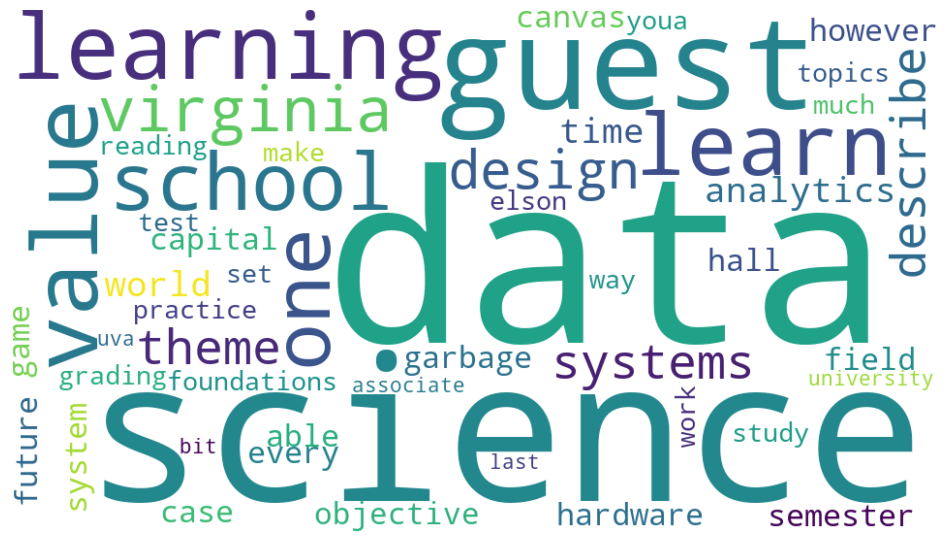

In [41]:
wordcloud(count_words(SDS)['freq'], max_words=50, save_name="SDS", save_plot=True)

## Topic Modeling

In [42]:
stopwords |= set(stop_words)
stopwords = list(stopwords)

In [43]:
num_topics = 5
rand_state = 658268

In [44]:
def display_topics(model, features, no_top_words=5):
    for topic, word_vector in enumerate(model.components_):
        total = word_vector.sum()
        largest = word_vector.argsort()[::-1] # invert sort order
        topic = topic+1
        print("\nTopic %02d" % topic)
        for i in range(0, no_top_words):
            print("  %s (%2.2f)" % (features[largest[i]],
                  word_vector[largest[i]]*100.0/total))

### NMF
Nonnegative Matrix Factorization 

In [45]:
tfidf_text = TfidfVectorizer(stop_words=stopwords, min_df=5, max_df=0.7)
vectors_text = tfidf_text.fit_transform(clean_corpus['text'])
vectors_text.shape

(34, 881)

In [46]:
nmf_text_model = NMF(n_components=num_topics, random_state=rand_state, max_iter=1000)
W_text_matrix = nmf_text_model.fit_transform(vectors_text)
H_text_matrix = nmf_text_model.components_

In [47]:
display_topics(nmf_text_model, tfidf_text.get_feature_names_out())



Topic 01
  code (1.27)
  days (0.81)
  cs (0.71)
  canvas (0.62)
  participation (0.61)

Topic 02
  linear (1.98)
  optimization (1.54)
  regression (1.53)
  machine (1.36)
  probability (1.36)

Topic 03
  points (4.11)
  stat (3.66)
  integrity (1.57)
  credit (1.51)
  collaboration (1.35)

Topic 04
  analytics (1.49)
  presentation (1.07)
  group (1.00)
  big (1.00)
  foundation (0.98)

Topic 05
  methods (1.20)
  notebooks (1.03)
  python (0.88)
  social (0.88)
  including (0.80)


In [48]:
W_text_matrix.sum(axis=0)/W_text_matrix.sum()*100.0

array([23.57572213, 23.17169724, 13.6050986 , 19.07032944, 20.57715258])

### LDA
latent dirichlet allocation

In [49]:
count_vectorizer = CountVectorizer(stop_words=stopwords, min_df=5, max_df=0.7)
count_vectors = count_vectorizer.fit_transform(clean_corpus['text'])

lda_model = LatentDirichletAllocation(n_components = num_topics, random_state=rand_state)
W_lda_matrix = lda_model.fit_transform(count_vectors)
H_lda_matrix = lda_model.components_


In [50]:
display_topics(lda_model, tfidf_text.get_feature_names_out())



Topic 01
  analytics (1.88)
  presentation (1.50)
  discussions (1.40)
  read (1.12)
  fall (0.97)

Topic 02
  python (1.18)
  regression (1.01)
  methods (0.80)
  statistics (0.69)
  probability (0.66)

Topic 03
  code (1.22)
  help (0.87)
  points (0.83)
  days (0.80)
  integrity (0.74)

Topic 04
  cs (2.97)
  code (2.91)
  projects (1.62)
  computer (1.24)
  semester (1.09)

Topic 05
  linear (2.36)
  machine (1.73)
  regression (1.65)
  foundations (1.46)
  set (1.36)


In [51]:
def wordcloud_topics(model, features, model_name, no_top_words=40):
    for topic, words in enumerate(model.components_):
        size = {}
        largest = words.argsort()[::-1] # invert sort order
        for i in range(0, no_top_words):
            size[features[largest[i]]] = abs(words[largest[i]])
        wc = WordCloud(background_color="white", max_words=100,
                       width=960, height=540)
        wc.generate_from_frequencies(size)
        plt.figure(figsize=(12,12))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis("off")
        # if you don't want to save the topic model, comment the next line
        plt.savefig(f'{model_name}_topic{topic}V2.png')

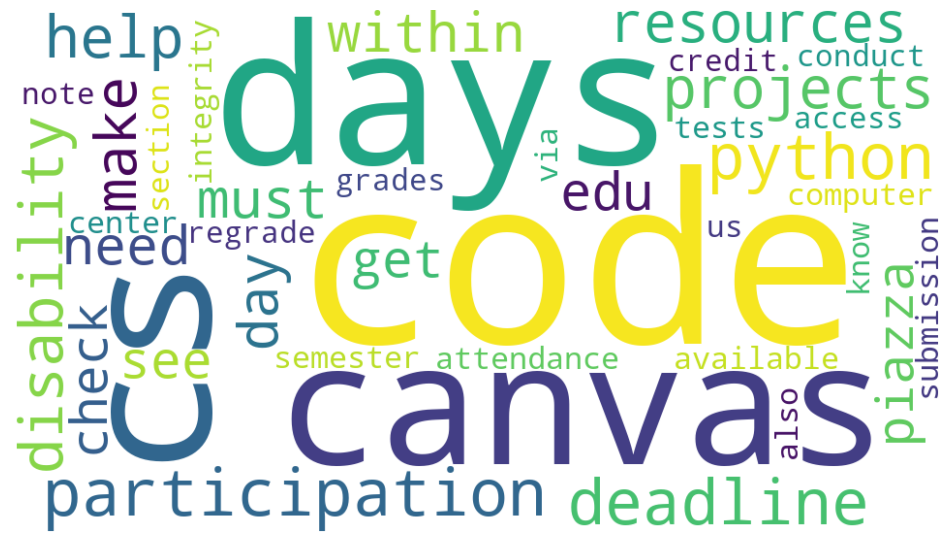

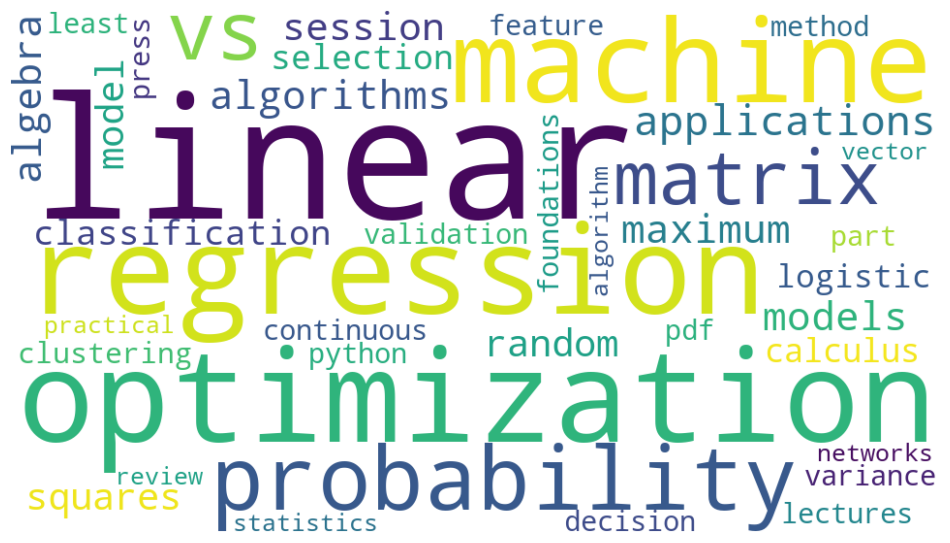

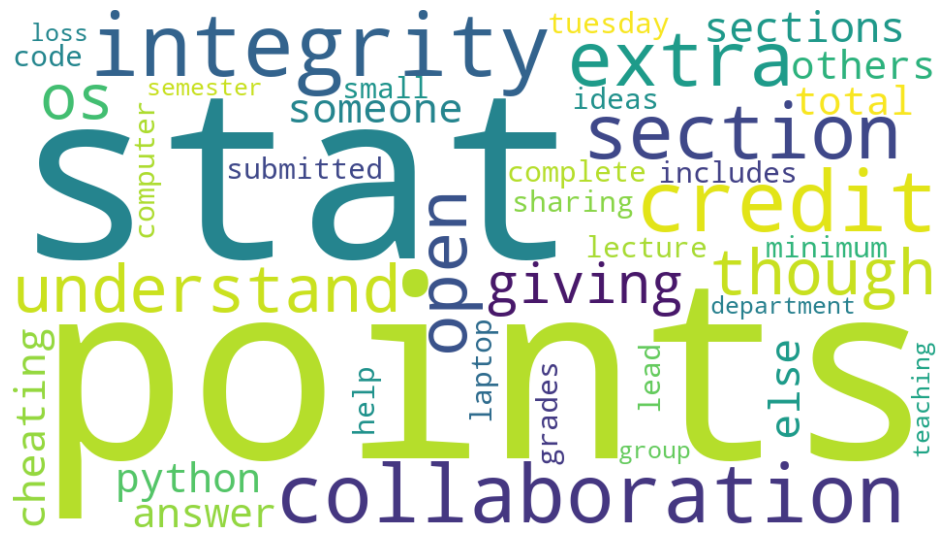

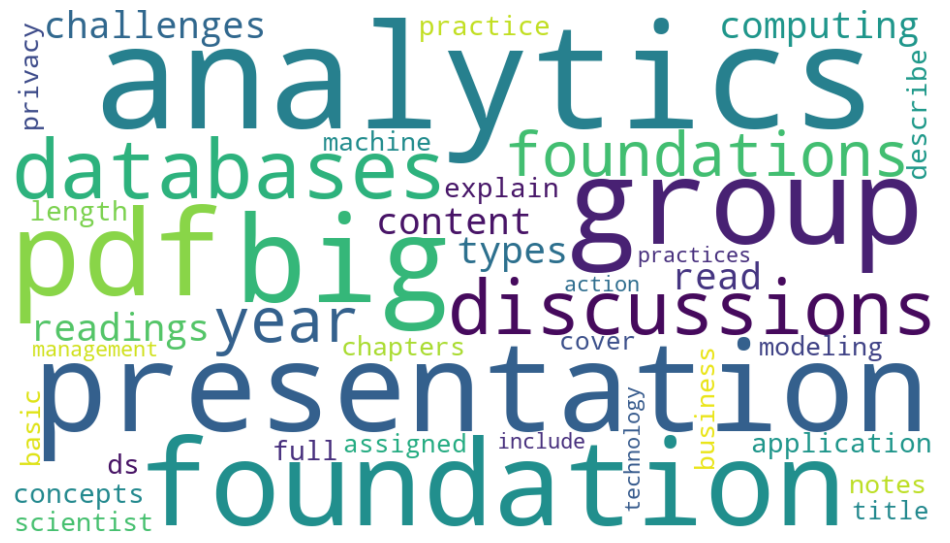

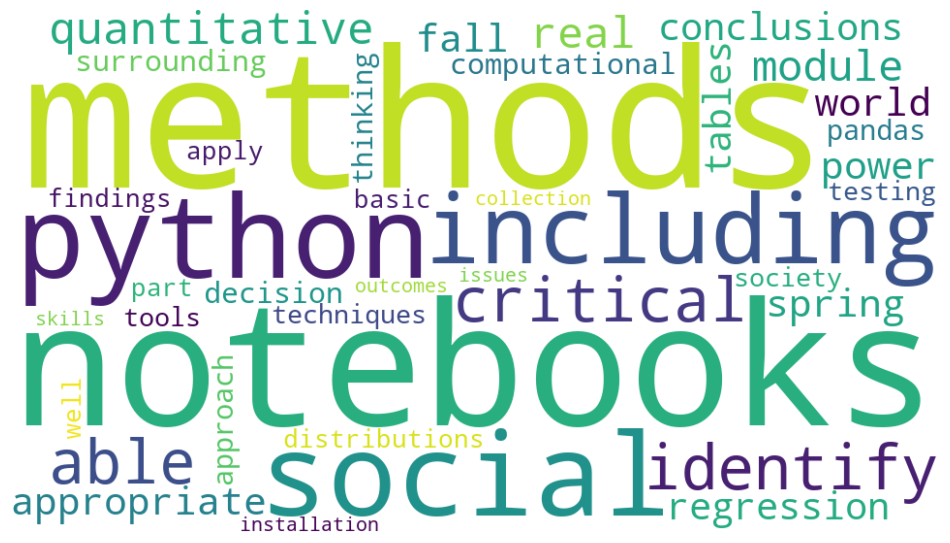

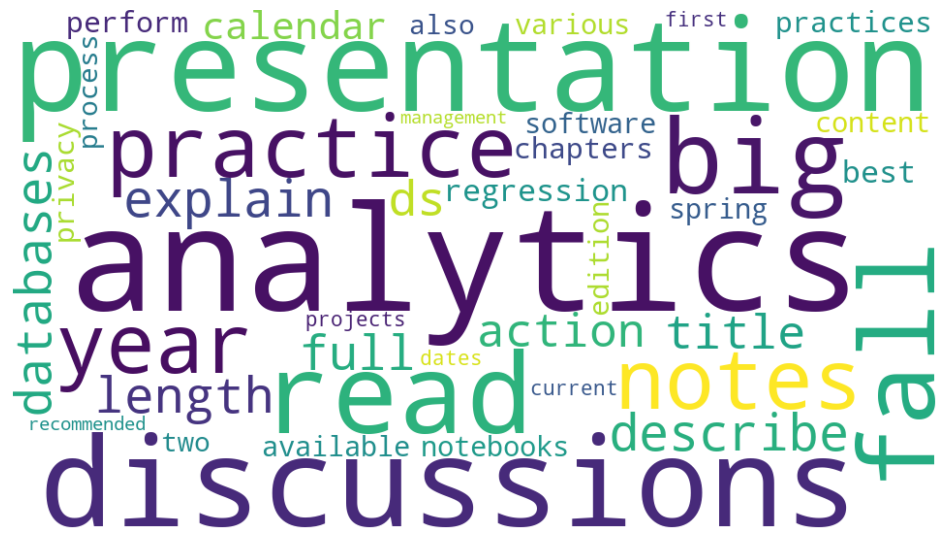

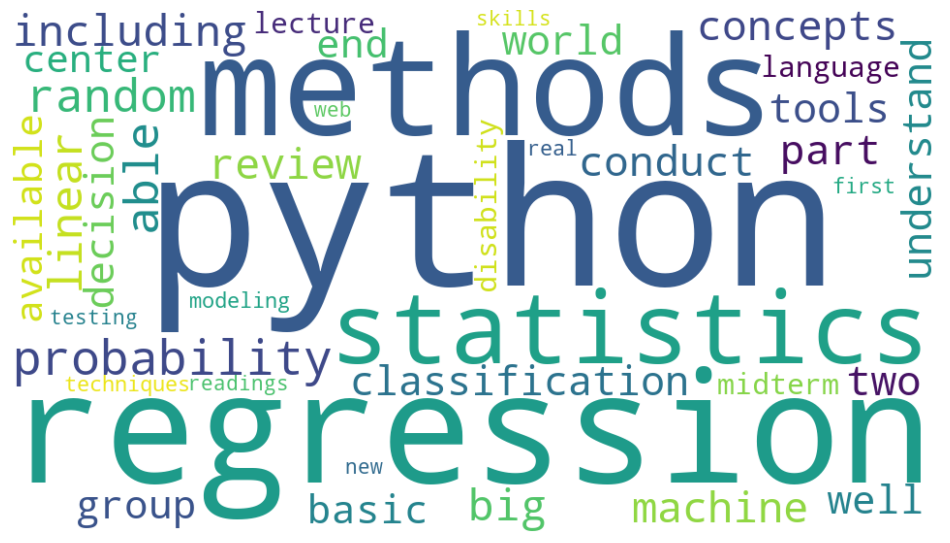

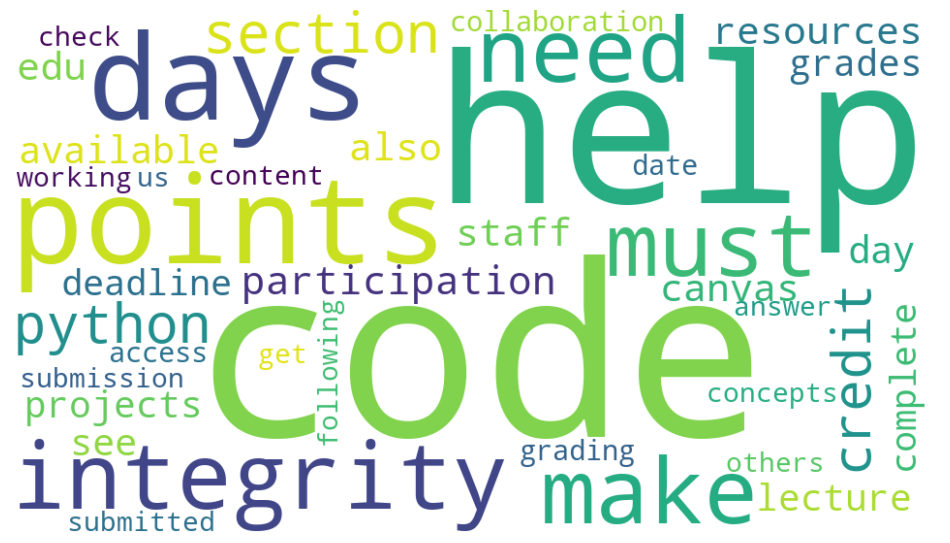

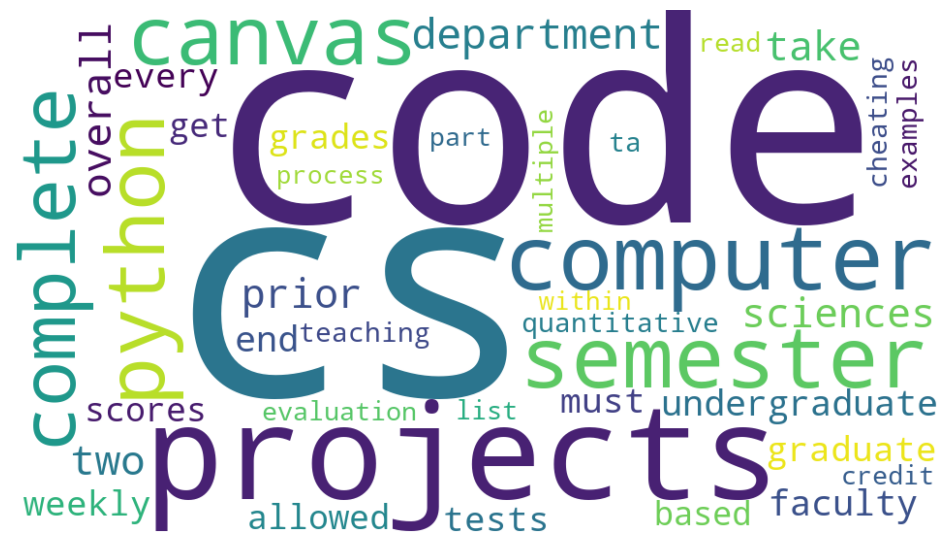

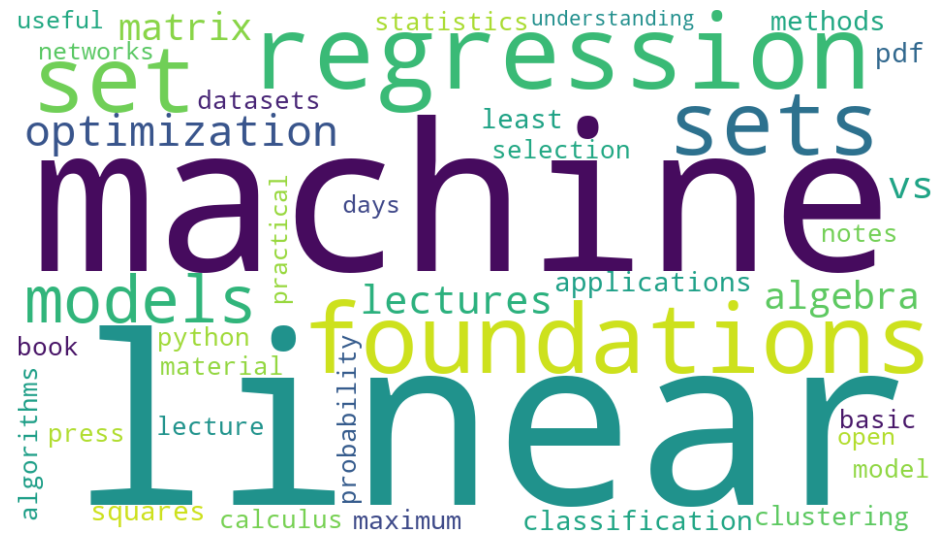

In [52]:
wordcloud_topics(nmf_text_model, tfidf_text.get_feature_names_out(), model_name = "NMF")
wordcloud_topics(lda_model, count_vectorizer.get_feature_names_out(), model_name = "LDA")

## Gensim

In [53]:
def display_topics_gensim(model):
    for topic in range(0, model.num_topics):
        print("\nTopic %02d" % topic)
        for (word, prob) in model.show_topic(topic, topn=5):
            print("  %s (%2.2f)" % (word, prob))

In [54]:
# create tokenized documents
gensim_docs = [[w for w in re.findall(r'\b\w\w+\b' , doc.lower())
                          if w not in stopwords]
                             for doc in clean_corpus["text"]]

In [55]:
from gensim.corpora import Dictionary
dict_gensim = Dictionary(gensim_docs)

In [56]:
dict_gensim.filter_extremes(no_below=5, no_above=0.7)

In [57]:
bow_gensim = [dict_gensim.doc2bow(doc) \
                    for doc in gensim_docs]

In [58]:
from gensim.models import TfidfModel

tfidf_gensim = TfidfModel(bow_gensim)
vectors_gensim = tfidf_gensim[bow_gensim]

### NMF

In [59]:
from gensim.models.nmf import Nmf
nmf_gensim = Nmf(vectors_gensim, num_topics=10,
                      id2word=dict_gensim, kappa=0.1, eval_every=5)

In [60]:
display_topics_gensim(nmf_gensim)


Topic 00
  participation (0.01)
  com (0.01)
  integrity (0.01)
  section (0.01)
  critical (0.01)

Topic 01
  maximum (0.01)
  piazza (0.01)
  probability (0.01)
  permitted (0.01)
  linear (0.01)

Topic 02
  stat (0.01)
  analytics (0.01)
  session (0.01)
  health (0.01)
  canvas (0.01)

Topic 03
  days (0.02)
  tests (0.01)
  python (0.01)
  com (0.01)
  regrade (0.01)

Topic 04
  interpretation (0.01)
  points (0.01)
  computing (0.01)
  session (0.01)
  group (0.01)

Topic 05
  points (0.01)
  foundation (0.01)
  stat (0.01)
  pdf (0.01)
  big (0.01)

Topic 06
  canvas (0.01)
  module (0.01)
  technology (0.01)
  methods (0.01)
  visualization (0.01)

Topic 07
  cs (0.01)
  notebooks (0.01)
  fall (0.01)
  quantitative (0.01)
  critical (0.01)

Topic 08
  days (0.01)
  degree (0.01)
  undergraduate (0.01)
  disability (0.01)
  feedback (0.01)

Topic 09
  algorithms (0.01)
  pdf (0.01)
  regression (0.01)
  canvas (0.01)
  selection (0.01)


In [61]:
from gensim.models.coherencemodel import CoherenceModel

nmf_gensim_coherence = CoherenceModel(model=nmf_gensim,
                                           texts=gensim_docs,
                                           dictionary=dict_gensim,
                                           coherence='c_v')
nmf_gensim_coherence_score = nmf_gensim_coherence.get_coherence()
print(nmf_gensim_coherence_score)

0.3116540120310175


In [62]:
nmf_model_n = []
for n in tqdm(range(2, 11)):
    nmf_model= Nmf(vectors_gensim, num_topics=n,
                    id2word=dict_gensim, kappa=0.1, eval_every=5)
    nmf_coherence = CoherenceModel(model=nmf_model, texts=gensim_docs,
                                   dictionary=dict_gensim, coherence='c_v')
    nmf_model_n.append((n, nmf_model, nmf_coherence.get_coherence()))

100%|██████████| 9/9 [00:33<00:00,  3.70s/it]


<Axes: xlabel='n'>

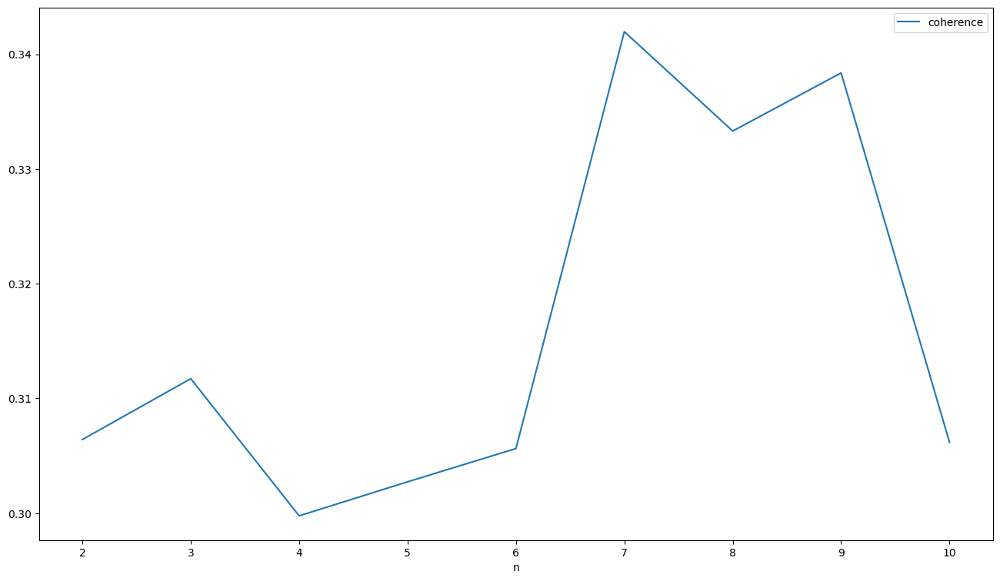

In [63]:
pd.DataFrame(nmf_model_n, columns=["n", "model", \
    "coherence"]).set_index("n")[["coherence"]].plot(figsize=(16,9))

### LDA

In [64]:
from gensim.models import LdaModel
lda_gensim = LdaModel(corpus=bow_gensim, id2word=dict_gensim,
    chunksize=2000, alpha='auto', eta='auto', iterations=400, num_topics=10, 
    passes=20, eval_every=None, random_state=42)

In [65]:
display_topics_gensim(lda_gensim)


Topic 00
  linear (0.04)
  regression (0.03)
  machine (0.02)
  methods (0.02)
  algorithms (0.02)

Topic 01
  tests (0.01)
  code (0.01)
  make (0.01)
  module (0.01)
  help (0.01)

Topic 02
  code (0.03)
  participation (0.03)
  deadline (0.01)
  resources (0.01)
  edu (0.01)

Topic 03
  practical (0.02)
  health (0.02)
  machine (0.02)
  linear (0.02)
  analytics (0.02)

Topic 04
  python (0.02)
  exercise (0.02)
  integrity (0.01)
  visualization (0.01)
  pdf (0.01)

Topic 05
  python (0.01)
  part (0.01)
  understand (0.01)
  able (0.01)
  end (0.01)

Topic 06
  probability (0.02)
  random (0.01)
  conduct (0.01)
  available (0.01)
  python (0.01)

Topic 07
  tools (0.02)
  center (0.01)
  python (0.01)
  free (0.01)
  important (0.01)

Topic 08
  points (0.02)
  days (0.01)
  code (0.01)
  credit (0.01)
  help (0.01)

Topic 09
  code (0.01)
  projects (0.01)
  discussions (0.01)
  must (0.01)
  read (0.01)


In [66]:
lda_gensim_coherence = CoherenceModel(model=lda_gensim,
    texts=gensim_docs, dictionary=dict_gensim, coherence='c_v')
lda_gensim_coherence_score = lda_gensim_coherence.get_coherence()
print(lda_gensim_coherence_score)

0.36190709305812196


In [67]:
top_topics = lda_gensim.top_topics(vectors_gensim, topn=5)
avg_topic_coherence = sum([t[1] for t in top_topics]) / len(top_topics)
print('Average topic coherence: %.4f.' % avg_topic_coherence)

Average topic coherence: -0.6003.


In [68]:
[(t[1], " ".join([w[1] for w in t[0]])) for t in top_topics]

[(-0.3530072803788096, 'points days code credit help'),
 (-0.45341221257037273, 'python part understand able end'),
 (-0.48347926303488303, 'linear regression machine methods algorithms'),
 (-0.5210889604084203, 'probability random conduct available python'),
 (-0.526836352279766, 'code participation deadline resources edu'),
 (-0.5328592051453699, 'tools center python free important'),
 (-0.558908110550416, 'code projects discussions must read'),
 (-0.6839509620472348, 'tests code make module help'),
 (-0.7849719804372629, 'practical health machine linear analytics'),
 (-1.1040676303814903, 'python exercise integrity visualization pdf')]

In [69]:
from gensim.models.ldamulticore import LdaMulticore
from tqdm import tqdm
lda_model_n = []
for n in tqdm(range(2, 11)):
    lda_model = LdaMulticore(corpus=bow_gensim, id2word=dict_gensim,
                             chunksize=2000, eta='auto', iterations=400,
                             num_topics=n, passes=20, eval_every=None,
                             random_state=42)
    lda_coherence = CoherenceModel(model=lda_model, texts=gensim_docs,
                                   dictionary=dict_gensim, coherence='c_v')
    lda_model_n.append((n, lda_model, lda_coherence.get_coherence()))

100%|██████████| 9/9 [01:41<00:00, 11.31s/it]


<Axes: xlabel='n'>

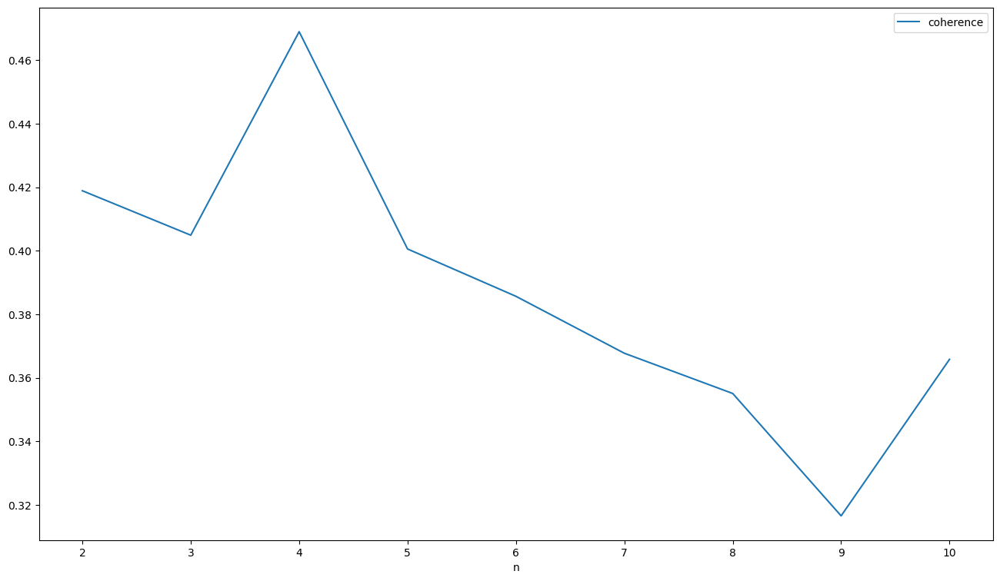

In [70]:
pd.DataFrame(lda_model_n, columns=["n", "model", \
    "coherence"]).set_index("n")[["coherence"]].plot(figsize=(16,9))

In [71]:
display_topics_gensim(lda_model_n[3][1])


Topic 00
  regression (0.01)
  big (0.01)
  analytics (0.01)
  part (0.01)
  python (0.01)

Topic 01
  code (0.02)
  projects (0.01)
  days (0.01)
  cs (0.01)
  help (0.01)

Topic 02
  code (0.01)
  edu (0.01)
  available (0.01)
  canvas (0.01)
  help (0.01)

Topic 03
  linear (0.02)
  probability (0.02)
  regression (0.02)
  machine (0.01)
  random (0.01)

Topic 04
  python (0.01)
  points (0.01)
  integrity (0.01)
  tools (0.01)
  visualization (0.01)


In [72]:
clean_corpus

,name,text,tokens
0,ASU,**Disclaimer** This syllabus is to be used as ...,"[disclaimer, used, guideline, information, pro..."
1,Boston_Uni,CS E Fall ' Foundations of Data Science...,"[cs, e, fall, foundations, data, science, offi..."
2,Brown,DATA COURSE PROPOSAL SYLLABUS FALL D...,"[data, proposal, fall, data, science, initiati..."
3,Cornell,"/ / , : PM INFO Syllabus / / , :...","[info, info, info, e, information, info, intro..."
4,CUNY,Syllabus CSC : Foundations of Data Scienc...,"[csc, foundations, data, science, instructor, ..."
5,Drexel,"College of Computing and Informatics, Drexel U...","[college, computing, informatics, drexel, univ..."
6,Georgia_Tech,"/ / , : PM / / , : PM ECE : Mat...","[ece, mathematical, foundations, data, science..."
7,Harvard,CSCI S- Foundation of Data Science and Engi...,"[csci, foundation, data, science, engineering,..."
8,LSU,"/ / , : PM Syllabus Introduction to Data ...","[introduction, data, science, overview, welcom..."
9,MIT,= OPEN . Fall Undergraduate Introduc...,"[open, fall, undergraduate, introduction, comp..."
